# **NextHikes IT Solutions Project 2:  Data Harmonization and Insights Extraction**

## **Problem Statement**
As a junior data scientist, your role is to address ambiguities and inconsistencies in
multiple datasets. The goal is to leverage advanced data-wrangling techniques to produce
a clean, unified dataset for future business analysis and modeling

### **Attribute information:**
• date = date of the ride

• season - 1 = spring, 2 = summer, 3 = fall, 4 = winter

• holiday - whether the day is considered a holiday

• working day - whether the day is neither a weekend nor a holiday

• weather:-
1: Clear, Few clouds, Partly cloudy, Partly cloudy
2: Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist
3: Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain
+Scattered clouds
4: Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog

• temp - "feels like" temperature in Celsius

• humidity - relative humidity

• windspeed - wind speed

• casual - number of non-registered user rentals initiated

• registered - number of registered user rentals initiated

• count - number of total rentals

## **Data Exploration**

__Data exploration has two goals:__

A) Understand the characteristics of the data

B) Identify data quality issues


**A. Building a data quality report**

The data quality report is the most important tool of the data exploration process.

It helps get familiar with the data and identify issues.

The data quality report consists of:
a) Tabular report for continuous features
b) Tabular report for categorical features
c) Data visualizations of values in each feature

In [71]:
#IMPORTING LIBRARIES- loading the libraries required, making their functions and features available for use in this Python program.

import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

import warnings 
warnings.filterwarnings('ignore')

# Set floating point numbers to be displayed with 2 decimal places
pd.set_option('display.float_format', '{:.2f}'.format)

#### Importing the dataset 1

In [72]:
df1=pd.read_csv("dataset1.csv")

In [73]:
#counting the rows and columns of the data set 1
df1.shape

(610, 10)

#### Here are all the features in our dataset 1:

In [74]:
# info() prints a concise summary of a DataFrame.
# Including the index dtype and column dtypes, non-null values and memory usage.

df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 610 entries, 0 to 609
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     610 non-null    int64  
 1   dteday      610 non-null    object 
 2   season      610 non-null    int64  
 3   yr          610 non-null    int64  
 4   mnth        610 non-null    int64  
 5   hr          610 non-null    int64  
 6   holiday     610 non-null    bool   
 7   weekday     610 non-null    int64  
 8   weathersit  610 non-null    int64  
 9   temp        610 non-null    float64
dtypes: bool(1), float64(1), int64(7), object(1)
memory usage: 43.6+ KB


In [75]:
#.head() method is used to display the first few rows of a DataFrame (or Series). 
#By default, it shows the first 5 rows.
#This is helpful when you want to quickly inspect the contents of a dataset without printing the entire table, especially if the dataset is large.

df1.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,weathersit,temp
0,1,01-01-2011,1,0,1,0,False,6,1,0.24
1,2,01-01-2011,1,0,1,1,False,6,1,0.22
2,3,01-01-2011,1,0,1,2,False,6,1,0.22
3,4,01-01-2011,1,0,1,3,False,6,1,0.24
4,5,01-01-2011,1,0,1,4,False,6,1,0.24


In [76]:
##Handling date in the dataset 1
df1['dteday'] = pd.to_datetime(df1['dteday'], format='%d-%m-%Y')
df1['yr']=df1['dteday'].dt.year
df1['mnth']=df1['dteday'].dt.month
df1['dteday']=df1['dteday'].dt.day

### Continous features report
Continuous features report includes:
Min,
1st quartile,
Mean,
2nd quartile - Median,
3rd quartile,
Max,
Standard deviation,
Total num of instances,
% missing values, Cardinality - num of distinct values for a feature.


In [77]:
#Pandas provides a function for generating data quality reports however it doesn't include all the statistics.
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
instant,610.00,305.50,176.24,1.00,153.25,305.50,457.75,610.00
dteday,610.00,13.82,7.80,1.00,7.00,14.00,21.00,28.00
season,610.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00
yr,610.00,2011.00,0.00,2011.00,2011.00,2011.00,2011.00,2011.00
mnth,610.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00
hr,610.00,11.80,6.85,0.00,6.00,12.00,18.00,23.00
weekday,610.00,2.98,2.05,0.00,1.00,3.00,5.00,6.00
weathersit,610.00,1.48,0.64,1.00,1.00,1.00,2.00,4.00
temp,610.00,0.20,0.08,0.02,0.16,0.20,0.23,0.46


### Categorical features report
Categorical features report includes:

Mode - the most frequent value,
2nd mode - the second most frequent value,
Frequency of mode,
Proportion of mode in the dataset,
Frequency of 2nd mode,
Proportion of 2nd mode in the dataset,
% missing values,
Cardinality

In [78]:
#Pandas provides a function i.e .describe() for generating data quality reports however it doesn't include all the statistics.

df1.describe(exclude=['number']).T

,count,unique,top,freq
holiday,610,2,False,586


## Feature visualization
The data quality report should also include visualization of each feature.

Visualization of feature values helps to quickly identify the distribution of its values.

Continuous feature - Histogram

If cardinality < 10 use bar plots instead

Categorical feature - Bar plot

Example--

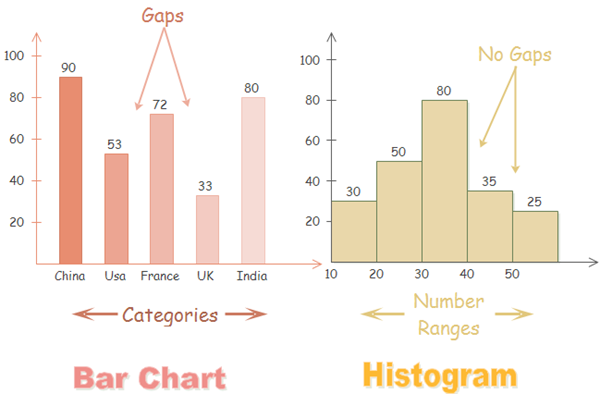

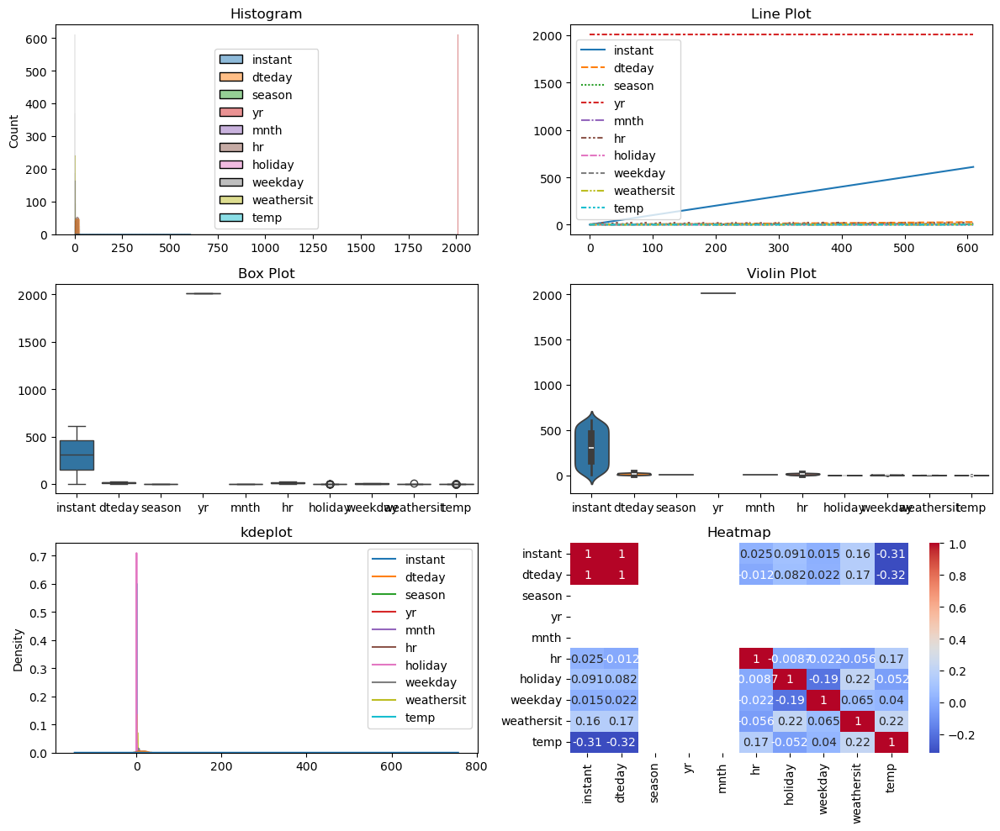

In [79]:
#Feature visualization for dataset 1

fig, axes = plt.subplots(3, 2, figsize=(12, 10))  # 2x2 grid of plots

# Histogram
sns.histplot(df1, ax=axes[0, 0])  # First subplot (top-left)
axes[0, 0].set_title('Histogram')

# Line plot
sns.lineplot(df1,ax=axes[0, 1])  # First row, second column
axes[0, 1].set_title('Line Plot')

# Box plot
sns.boxplot(df1,ax=axes[1, 0])  # Second row, first column
axes[1, 0].set_title('Box Plot')

# Violin plot
sns.violinplot(df1,ax=axes[1, 1])  # Second row, second column
axes[1, 1].set_title('Violin Plot')

#kdeplot
sns.kdeplot(df1,ax=axes[2,0])
axes[2,0].set_title('kdeplot')

#heatmap
sns.heatmap(df1.corr(), annot=True, cmap='coolwarm', ax=axes[2, 1])  # Fourth row, right
axes[2, 1].set_title('Heatmap')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

#### **B. Data Quality Issues**

After getting to know the data, the second goal of data exploration is to identify any data quality issues in the dataset.

The most common data quality issues are:

Missing values,
Irregular cardinality,
Outliers,

**B.1. Missing values**

We will refer to missing data in Python as:
the special floating-point NaN (acronym for Not a Number) value, and the Python None object

Pandas treats None and NaN as interchangeable for indicating missing or null values.

There are several useful methods for detecting, removing, and replacing null values in Pandas data structures

isnull(): Generate a boolean mask indicating missing values

notnull(): Opposite of isnull()

dropna(): Return a filtered version of the data

fillna(): Return a copy of the data with missing values filled or imputed

In [80]:
#checking null values in data set 1
df1.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
weathersit    0
temp          0
dtype: int64

#### Importing the dataset 2

In [81]:

df2=pd.read_csv("dataset2.csv")

#### Here are all the features in our dataset 2:

In [82]:
#counting the rows and columns of the data set 2
df2.shape

(610, 8)

In [83]:
df2.head()

,Unnamed: 0,instant,atemp,hum,windspeed,casual,registered,cnt
0,0,1,0.29,0.81,0.00,3,13,16
1,1,2,0.27,0.80,0.00,8,32,40
2,2,3,0.27,0.80,0.00,5,27,32
3,3,4,0.29,0.75,0.00,3,10,13
4,4,5,0.29,0.75,0.00,0,1,1


In [84]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 610 entries, 0 to 609
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  610 non-null    int64  
 1   instant     610 non-null    int64  
 2   atemp       599 non-null    float64
 3   hum         610 non-null    float64
 4   windspeed   610 non-null    float64
 5   casual      610 non-null    int64  
 6   registered  610 non-null    int64  
 7   cnt         610 non-null    int64  
dtypes: float64(3), int64(5)
memory usage: 38.3 KB


#### Continous features report for data set 2

In [85]:

df2.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,610.00,304.50,176.24,0.00,152.25,304.50,456.75,609.00
instant,610.00,305.50,176.24,1.00,153.25,305.50,457.75,610.00
atemp,599.00,0.20,0.08,0.00,0.15,0.20,0.24,0.45
hum,610.00,0.56,0.18,0.21,0.43,0.52,0.69,1.00
windspeed,610.00,0.20,0.12,0.00,0.10,0.19,0.28,0.58
casual,610.00,4.50,6.32,0.00,0.00,2.00,6.00,47.00
registered,610.00,51.07,47.02,0.00,14.00,43.00,70.00,247.00
cnt,610.00,55.57,49.32,1.00,16.00,47.00,79.75,249.00


In [86]:
#dropping unnecessary column
df2.drop("Unnamed: 0",axis=1, inplace=True)

In [87]:
#double checking if column Unnamed: 0 is dropped or not
df2.head()

,instant,atemp,hum,windspeed,casual,registered,cnt
0,1,0.29,0.81,0.00,3,13,16
1,2,0.27,0.80,0.00,8,32,40
2,3,0.27,0.80,0.00,5,27,32
3,4,0.29,0.75,0.00,3,10,13
4,5,0.29,0.75,0.00,0,1,1


In [88]:
#checking null values in data set 2
df2.isnull().sum()

instant        0
atemp         11
hum            0
windspeed      0
casual         0
registered     0
cnt            0
dtype: int64

In [89]:
#filling the null values using .fillna()
df2["atemp"]=df2["atemp"].fillna(df2["atemp"].mean())

In [90]:
# df2.isnull().sum()

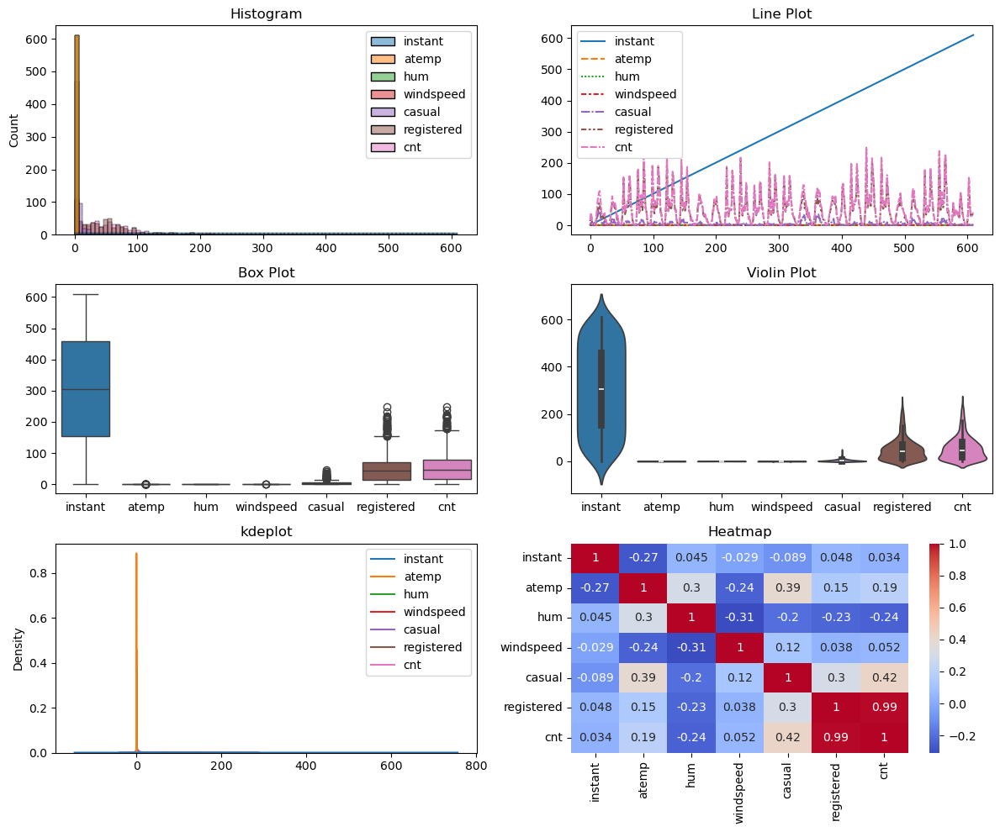

In [91]:
#Feature visualization for dataset 2

fig, axes = plt.subplots(3, 2, figsize=(12, 10))  # 3x2 grid of plots

# Histogram
sns.histplot(df2,ax=axes[0, 0])  # First subplot (top-left)
axes[0, 0].set_title('Histogram')

# Line plot
sns.lineplot(df2,ax=axes[0, 1])  # First row, second column
axes[0, 1].set_title('Line Plot')

# Box plot
sns.boxplot(df2,ax=axes[1, 0])  # Second row, first column
axes[1, 0].set_title('Box Plot')

# Violin plot
sns.violinplot(df2,ax=axes[1, 1])  # Second row, second column
axes[1, 1].set_title('Violin Plot')

#kdeplot
sns.kdeplot(df2,ax=axes[2,0])
axes[2,0].set_title('kdeplot')

#heatmap
sns.heatmap(df2.corr(), annot=True, cmap='coolwarm', ax=axes[2, 1])  # Fourth row, right
axes[2, 1].set_title('Heatmap')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


## Merging the dataset 1 and data set 2
The pd.merge() function in Pandas is used to merge two DataFrames based on one or more common columns

In [92]:
df3=pd.merge(df1,df2,on='instant')

#### Continous features report for Merged data set 

In [93]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 610 entries, 0 to 609
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     610 non-null    int64  
 1   dteday      610 non-null    int32  
 2   season      610 non-null    int64  
 3   yr          610 non-null    int32  
 4   mnth        610 non-null    int32  
 5   hr          610 non-null    int64  
 6   holiday     610 non-null    bool   
 7   weekday     610 non-null    int64  
 8   weathersit  610 non-null    int64  
 9   temp        610 non-null    float64
 10  atemp       610 non-null    float64
 11  hum         610 non-null    float64
 12  windspeed   610 non-null    float64
 13  casual      610 non-null    int64  
 14  registered  610 non-null    int64  
 15  cnt         610 non-null    int64  
dtypes: bool(1), float64(4), int32(3), int64(8)
memory usage: 65.1 KB


In [94]:
df3.shape

(610, 16)

In [95]:
df3.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,1,1,2011,1,0,False,6,1,0.24,0.29,0.81,0.00,3,13,16
1,2,1,1,2011,1,1,False,6,1,0.22,0.27,0.80,0.00,8,32,40
2,3,1,1,2011,1,2,False,6,1,0.22,0.27,0.80,0.00,5,27,32
3,4,1,1,2011,1,3,False,6,1,0.24,0.29,0.75,0.00,3,10,13
4,5,1,1,2011,1,4,False,6,1,0.24,0.29,0.75,0.00,0,1,1


In [96]:
df3.describe().T

,count,mean,std,min,25%,50%,75%,max
instant,610.00,305.50,176.24,1.00,153.25,305.50,457.75,610.00
dteday,610.00,13.82,7.80,1.00,7.00,14.00,21.00,28.00
season,610.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00
yr,610.00,2011.00,0.00,2011.00,2011.00,2011.00,2011.00,2011.00
mnth,610.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00
hr,610.00,11.80,6.85,0.00,6.00,12.00,18.00,23.00
weekday,610.00,2.98,2.05,0.00,1.00,3.00,5.00,6.00
weathersit,610.00,1.48,0.64,1.00,1.00,1.00,2.00,4.00
temp,610.00,0.20,0.08,0.02,0.16,0.20,0.23,0.46
atemp,610.00,0.20,0.08,0.00,0.15,0.20,0.23,0.45


In [97]:
#checking null values in data set 3
df3.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

#### Importing the dataset 3

In [98]:
df4=pd.read_csv("dataset3.csv")

In [99]:
df4.shape

(390, 16)

#### Continous features report for data set 3

In [100]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 390 entries, 0 to 389
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     390 non-null    int64  
 1   dteday      390 non-null    object 
 2   season      390 non-null    int64  
 3   yr          390 non-null    int64  
 4   mnth        390 non-null    int64  
 5   hr          390 non-null    int64  
 6   holiday     390 non-null    bool   
 7   weekday     390 non-null    int64  
 8   weathersit  390 non-null    int64  
 9   temp        390 non-null    float64
 10  atemp       390 non-null    float64
 11  hum         390 non-null    float64
 12  windspeed   390 non-null    float64
 13  casual      390 non-null    int64  
 14  registered  390 non-null    int64  
 15  cnt         390 non-null    int64  
dtypes: bool(1), float64(4), int64(10), object(1)
memory usage: 46.2+ KB


In [101]:
df4.describe().T

,count,mean,std,min,25%,50%,75%,max
instant,390.00,805.50,112.73,611.00,708.25,805.50,902.75,1000.00
season,390.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00
yr,390.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
mnth,390.00,1.80,0.40,1.00,2.00,2.00,2.00,2.00
hr,390.00,11.69,6.98,0.00,6.00,12.00,18.00,23.00
weekday,390.00,2.99,2.15,0.00,1.00,3.00,5.00,6.00
weathersit,390.00,1.48,0.66,1.00,1.00,1.00,2.00,3.00
temp,390.00,0.22,0.07,0.06,0.16,0.22,0.26,0.42
atemp,390.00,0.23,0.07,0.08,0.18,0.23,0.27,0.42
hum,390.00,0.61,0.20,0.21,0.45,0.60,0.75,1.00


#### Rearranging the data set 3:
There are 9 enteries from 611 to 619 arranged at the bottom of the dataset 3 which are rearranged 

In [102]:
bottom_9 = df4.tail(9)
rest_of_data = df4.iloc[:-9]
df4_rearranged = pd.concat([bottom_9, rest_of_data], ignore_index=True)

from IPython.display import FileLink

#dowloading the data set 
df4_rearranged.to_csv('rearranged_dataset.csv', index=False)
FileLink('rearranged_dataset.csv')

C:\Users\avant\Avantika Digicrome\Python basics\AI COURSE DIGICROME\Next Hikes project 2\rearranged_dataset.csv

### Importing Rearranged data set 3

In [103]:
df4=pd.read_csv("rearranged_dataset.csv")

In [104]:
df4

,instant,dteday,season,yr,mnth,hr,holiday,weekday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,611,28-01-2011,1,0,1,16,False,5,1,0.22,0.27,0.80,0.00,10,70,80
1,612,28-01-2011,1,0,1,17,False,5,1,0.24,0.24,0.75,0.13,2,147,149
2,613,28-01-2011,1,0,1,18,False,5,1,0.24,0.23,0.75,0.19,2,107,109
3,614,28-01-2011,1,0,1,19,False,5,2,0.24,0.24,0.75,0.13,5,84,89
4,615,28-01-2011,1,0,1,20,False,5,2,0.24,0.23,0.70,0.19,1,61,62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
385,996,14-02-2011,1,0,2,3,False,1,1,0.34,0.32,0.46,0.22,1,1,2
386,997,14-02-2011,1,0,2,4,False,1,1,0.32,0.30,0.53,0.28,0,2,2
387,998,14-02-2011,1,0,2,5,False,1,1,0.32,0.30,0.53,0.28,0,3,3
388,999,14-02-2011,1,0,2,6,False,1,1,0.34,0.30,0.46,0.30,1,25,26


In [105]:
df4.tail()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
385,996,14-02-2011,1,0,2,3,False,1,1,0.34,0.32,0.46,0.22,1,1,2
386,997,14-02-2011,1,0,2,4,False,1,1,0.32,0.30,0.53,0.28,0,2,2
387,998,14-02-2011,1,0,2,5,False,1,1,0.32,0.30,0.53,0.28,0,3,3
388,999,14-02-2011,1,0,2,6,False,1,1,0.34,0.30,0.46,0.30,1,25,26
389,1000,14-02-2011,1,0,2,7,False,1,1,0.34,0.30,0.46,0.30,2,96,98


In [106]:
##Handling date in the dataset 3
df4['dteday'] = pd.to_datetime(df4['dteday'], format='%d-%m-%Y')
df4['yr']=df4['dteday'].dt.year
df4['mnth']=df4['dteday'].dt.month
df4['dteday']=df4['dteday'].dt.day

In [107]:
df4.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,611,28,1,2011,1,16,False,5,1,0.22,0.27,0.80,0.00,10,70,80
1,612,28,1,2011,1,17,False,5,1,0.24,0.24,0.75,0.13,2,147,149
2,613,28,1,2011,1,18,False,5,1,0.24,0.23,0.75,0.19,2,107,109
3,614,28,1,2011,1,19,False,5,2,0.24,0.24,0.75,0.13,5,84,89
4,615,28,1,2011,1,20,False,5,2,0.24,0.23,0.70,0.19,1,61,62


In [108]:
df4.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

#### Feature visualization for dataset 3

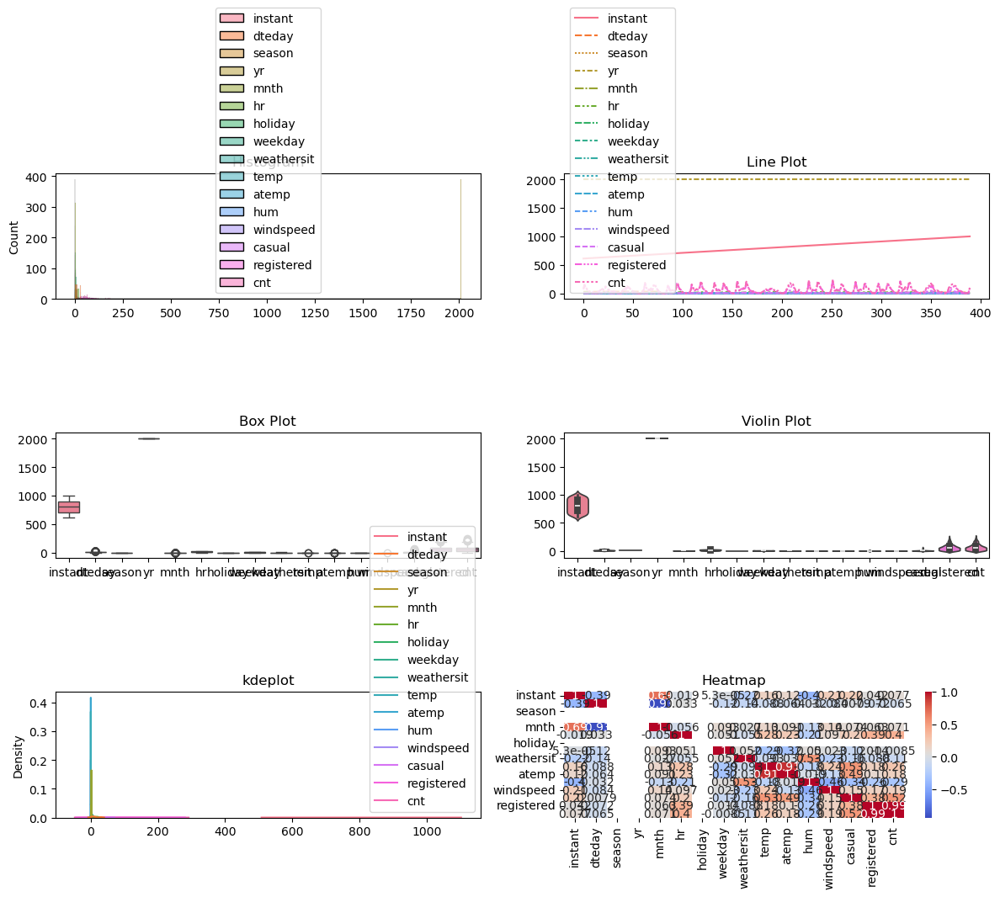

In [109]:
fig, axes = plt.subplots(3, 2, figsize=(12, 10))  # 3x2 grid of plots

# Histogram
sns.histplot(df4,ax=axes[0, 0])  # First subplot (top-left)
axes[0, 0].set_title('Histogram')

# Line plot
sns.lineplot(df4,ax=axes[0, 1])  # First row, second column
axes[0, 1].set_title('Line Plot')

# Box plot
sns.boxplot(df4,ax=axes[1, 0])  # Second row, first column
axes[1, 0].set_title('Box Plot')

# Violin plot
sns.violinplot(df4,ax=axes[1, 1])  # Second row, second column
axes[1, 1].set_title('Violin Plot')

#kdeplot
sns.kdeplot(df4,ax=axes[2,0])
axes[2,0].set_title('kdeplot')

#heatmap
sns.heatmap(df4.corr(), annot=True, cmap='coolwarm', ax=axes[2, 1])  # Fourth row, right
axes[2, 1].set_title('Heatmap')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

### Concatenate Dataset_3 with the Merged dataset.

**Creating the final data set i.e df** 

In Pandas, you can concatenate datasets (DataFrames or Series) using the pd.concat() function. This function is used to combine multiple DataFrames along rows (axis=0) or columns (axis=1).

In [110]:
df=pd.concat([df3, df4], axis=0, ignore_index=True)

In [111]:
df

,instant,dteday,season,yr,mnth,hr,holiday,weekday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,1,1,2011,1,0,False,6,1,0.24,0.29,0.81,0.00,3,13,16
1,2,1,1,2011,1,1,False,6,1,0.22,0.27,0.80,0.00,8,32,40
2,3,1,1,2011,1,2,False,6,1,0.22,0.27,0.80,0.00,5,27,32
3,4,1,1,2011,1,3,False,6,1,0.24,0.29,0.75,0.00,3,10,13
4,5,1,1,2011,1,4,False,6,1,0.24,0.29,0.75,0.00,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,996,14,1,2011,2,3,False,1,1,0.34,0.32,0.46,0.22,1,1,2
996,997,14,1,2011,2,4,False,1,1,0.32,0.30,0.53,0.28,0,2,2
997,998,14,1,2011,2,5,False,1,1,0.32,0.30,0.53,0.28,0,3,3
998,999,14,1,2011,2,6,False,1,1,0.34,0.30,0.46,0.30,1,25,26


In [112]:
df.shape

(1000, 16)

**Here are the features of final data set**

In [113]:
df.head()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,1,1,2011,1,0,False,6,1,0.24,0.29,0.81,0.00,3,13,16
1,2,1,1,2011,1,1,False,6,1,0.22,0.27,0.80,0.00,8,32,40
2,3,1,1,2011,1,2,False,6,1,0.22,0.27,0.80,0.00,5,27,32
3,4,1,1,2011,1,3,False,6,1,0.24,0.29,0.75,0.00,3,10,13
4,5,1,1,2011,1,4,False,6,1,0.24,0.29,0.75,0.00,0,1,1


In [114]:
df.tail()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
995,996,14,1,2011,2,3,False,1,1,0.34,0.32,0.46,0.22,1,1,2
996,997,14,1,2011,2,4,False,1,1,0.32,0.30,0.53,0.28,0,2,2
997,998,14,1,2011,2,5,False,1,1,0.32,0.30,0.53,0.28,0,3,3
998,999,14,1,2011,2,6,False,1,1,0.34,0.30,0.46,0.30,1,25,26
999,1000,14,1,2011,2,7,False,1,1,0.34,0.30,0.46,0.30,2,96,98


In [115]:
df.shape

(1000, 16)

In [116]:

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     1000 non-null   int64  
 1   dteday      1000 non-null   int32  
 2   season      1000 non-null   int64  
 3   yr          1000 non-null   int32  
 4   mnth        1000 non-null   int32  
 5   hr          1000 non-null   int64  
 6   holiday     1000 non-null   bool   
 7   weekday     1000 non-null   int64  
 8   weathersit  1000 non-null   int64  
 9   temp        1000 non-null   float64
 10  atemp       1000 non-null   float64
 11  hum         1000 non-null   float64
 12  windspeed   1000 non-null   float64
 13  casual      1000 non-null   int64  
 14  registered  1000 non-null   int64  
 15  cnt         1000 non-null   int64  
dtypes: bool(1), float64(4), int32(3), int64(8)
memory usage: 106.6 KB


In [117]:
df.count()

instant       1000
dteday        1000
season        1000
yr            1000
mnth          1000
hr            1000
holiday       1000
weekday       1000
weathersit    1000
temp          1000
atemp         1000
hum           1000
windspeed     1000
casual        1000
registered    1000
cnt           1000
dtype: int64

#### Continuous feature report for final data set

In [118]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
instant,1000.00,500.50,288.82,1.00,250.75,500.50,750.25,1000.00
dteday,1000.00,12.99,8.66,1.00,6.00,11.00,20.00,31.00
season,1000.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00
yr,1000.00,2011.00,0.00,2011.00,2011.00,2011.00,2011.00,2011.00
mnth,1000.00,1.31,0.46,1.00,1.00,1.00,2.00,2.00
hr,1000.00,11.75,6.90,0.00,6.00,12.00,18.00,23.00
weekday,1000.00,2.98,2.09,0.00,1.00,3.00,5.00,6.00
weathersit,1000.00,1.48,0.65,1.00,1.00,1.00,2.00,4.00
temp,1000.00,0.21,0.08,0.02,0.16,0.20,0.24,0.46
atemp,1000.00,0.21,0.08,0.00,0.17,0.21,0.26,0.45


In [119]:
#We can also manually build the Continuous feature report:

def build_continuous_features_report(df):

    """Build tabular report for continuous features"""

    stats = {
        "Count": len,
        "Miss %": lambda df: df.isna().sum() / len(df) * 100,
        "Card.": lambda df: df.nunique(),
        "Min": lambda df: df.min(),
        "1st Qrt.": lambda df: df.quantile(0.25),
        "Mean": lambda df: df.mean(),
        "Median": lambda df: df.median(),
        "3rd Qrt": lambda df: df.quantile(0.75),
        "Max": lambda df: df.max(),
        "Std. Dev.": lambda df: df.std(),
    }

    contin_feat_names = df.select_dtypes("number").columns
    continuous_data_df = df[contin_feat_names]

    report_df = pd.DataFrame(index=contin_feat_names, columns=stats.keys())

    for stat_name, fn in stats.items():
            report_df[stat_name] = fn(continuous_data_df)

    return report_df

In [120]:
build_continuous_features_report(df)

,Count,Miss %,Card.,Min,1st Qrt.,Mean,Median,3rd Qrt,Max,Std. Dev.
instant,1000,0.00,1000,1.00,250.75,500.50,500.50,750.25,1000.00,288.82
dteday,1000,0.00,31,1.00,6.00,12.99,11.00,20.00,31.00,8.66
season,1000,0.00,1,1.00,1.00,1.00,1.00,1.00,1.00,0.00
yr,1000,0.00,1,2011.00,2011.00,2011.00,2011.00,2011.00,2011.00,0.00
mnth,1000,0.00,2,1.00,1.00,1.31,1.00,2.00,2.00,0.46
hr,1000,0.00,24,0.00,6.00,11.75,12.00,18.00,23.00,6.90
weekday,1000,0.00,7,0.00,1.00,2.98,3.00,5.00,6.00,2.09
weathersit,1000,0.00,4,1.00,1.00,1.48,1.00,2.00,4.00,0.65
temp,1000,0.00,23,0.02,0.16,0.21,0.20,0.24,0.46,0.08
atemp,1000,0.00,31,0.00,0.17,0.21,0.21,0.26,0.45,0.08


**B.2. Irregular Cardinality**

The Card. column in the data quality report shows the number of distinct values present for a feature within a dataset

A data quality issue arises when the cardinality for a feature does not match what we expect, a mismatch called an irregular cardinality

__Most common issues:__

a)Features with a cardinality of 1

b)Too high cardinality for categorical features

c)Too low cardinality for continous features


#### Categorical feature report for final data set

In [121]:
df.describe(exclude=['number']).T

,count,unique,top,freq
holiday,1000,2,False,976


In [122]:
#converting column holiday dtype bool to int

from sklearn.preprocessing import LabelEncoder
lb=LabelEncoder()
df["holiday"]=lb.fit_transform(df["holiday"])


In [123]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     1000 non-null   int64  
 1   dteday      1000 non-null   int32  
 2   season      1000 non-null   int64  
 3   yr          1000 non-null   int32  
 4   mnth        1000 non-null   int32  
 5   hr          1000 non-null   int64  
 6   holiday     1000 non-null   int64  
 7   weekday     1000 non-null   int64  
 8   weathersit  1000 non-null   int64  
 9   temp        1000 non-null   float64
 10  atemp       1000 non-null   float64
 11  hum         1000 non-null   float64
 12  windspeed   1000 non-null   float64
 13  casual      1000 non-null   int64  
 14  registered  1000 non-null   int64  
 15  cnt         1000 non-null   int64  
dtypes: float64(4), int32(3), int64(9)
memory usage: 113.4 KB


In [124]:
df.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
hr            0
holiday       0
weekday       0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [125]:
def am_or_pm(x): 
    if x > 11: 
        return 1
    else: 
        return 0
  

df['am_or_pm']=df['hr'].apply(am_or_pm)

In [126]:
#finding Mean and Median

median_values= df.median()
print("Median values for all numeric columns:")
print(median_values)

mean_values= df.mean()
print("Mean values for all numeric columns:")
print(mean_values)


Median values for all numeric columns:
instant       500.50
dteday         11.00
season          1.00
yr           2011.00
mnth            1.00
hr             12.00
holiday         0.00
weekday         3.00
weathersit      1.00
temp            0.20
atemp           0.21
hum             0.55
windspeed       0.16
casual          3.00
registered     46.00
cnt            49.00
am_or_pm        1.00
dtype: float64
Mean values for all numeric columns:
instant       500.50
dteday         12.99
season          1.00
yr           2011.00
mnth            1.31
hr             11.75
holiday         0.02
weekday         2.98
weathersit      1.48
temp            0.21
atemp           0.21
hum             0.58
windspeed       0.19
casual          4.92
registered     53.38
cnt            58.30
am_or_pm        0.52
dtype: float64


In [127]:
#checking for duplicates
df.duplicated().sum()

0

#### B.3. Outliers

Outliers are values that lie far away from the central tendency of a feature.

One way to detect outliers is select all values outside of the interquartile range.

The interquartile range (IQR), also called the midspread or middle 50%, or technically H-spread, is a measure of statistical dispersion, being equal to the difference between 75th and 25th percentiles, or between upper and lower quartiles,

### **IQR=Q3-Q1**

## Outlier Detection
Visualize and address anomalies in user counts and environmental data.

In [128]:
#checking number of outliers for each numerical key feature using IQR method

num_column=df.select_dtypes(include=['float64','int64']).columns

# Initialize a dictionary to store the number of outliers for each feature
outliers_count = {}

# Calculate the number of outliers using the IQR method
for feature in num_column:
    if feature in df.columns:
        Q1 = df[feature].quantile(0.25)
        Q3 = df[feature].quantile(0.75)
        IQR = Q3 - Q1
        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR
        outliers = df[(df[feature] < lower_limit) | (df[feature] > upper_limit)]
        outliers_count[feature] = len(outliers)
        
    else:
        print(f"Column '{feature}' not found in DataFrame")

# Display the number of outliers for each key feature
print("Number of outliers in each key feature:")
for feature, count in outliers_count.items():
    print(f"{feature}:{count}")

Number of outliers in each key feature:
instant:0
season:0
hr:0
holiday:24
weekday:0
weathersit:1
temp:66
atemp:41
hum:0
windspeed:4
casual:66
registered:45
cnt:30
am_or_pm:0


<Axes: >

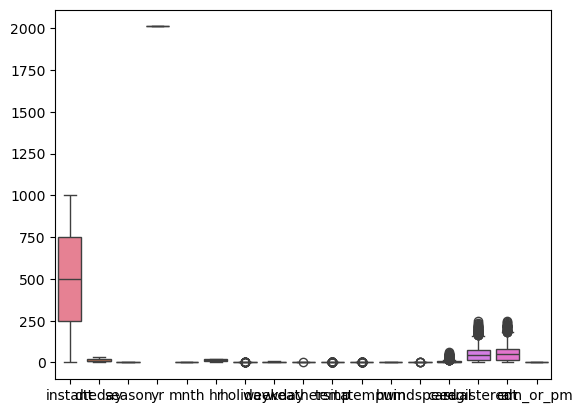

In [129]:
sns.boxplot(df)

### BOX PLOT

A box plot (also known as a box-and-whisker plot) is a graphical representation of the distribution of a dataset. It displays the median, quartiles, and outliers, providing a visual summary of the data’s spread, central tendency, and variability. Box plots are particularly useful for comparing distributions between different groups or datasets.

**Outliers**- Data points that fall outside the whiskers. These are usually values that are 1.5 * IQR above Q3 or below Q1. Outliers are often plotted as individual points or dots.

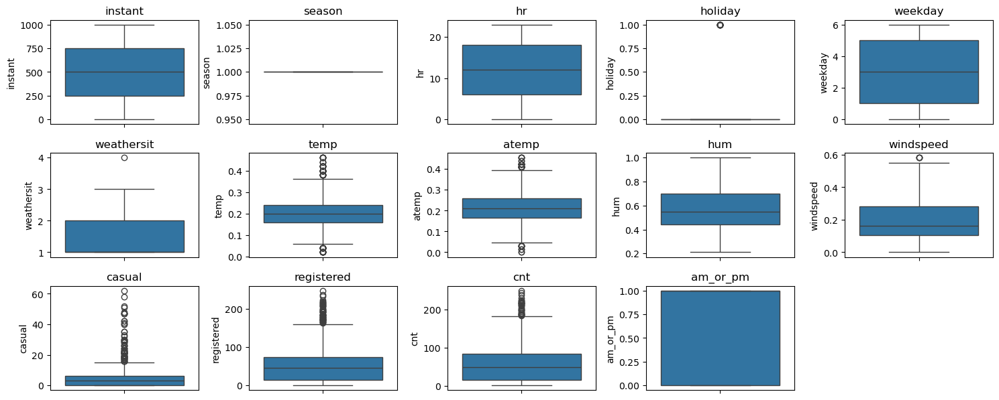

In [130]:
plt.figure(figsize=(15,10))
for i,col in enumerate(num_column,1):
    plt.subplot(5, 5, i)
    sns.boxplot(y=df[col])
    plt.title(col)
    
plt.tight_layout()
plt.show()

#### Handling Outliers Individually for each feature

In [131]:
#FOR WEATHERSIT FEATURE

q1=df["weathersit"].quantile(0.25)
q2=df["weathersit"].quantile(0.50)
q3=df["weathersit"].quantile(0.75)
print("The first quantile is",q1)
print("The second quantile is",q2)
print("The third quantile is",q3)

IQR=q3-q1
print("The inner quantile is",IQR)

lower_limit=q1-1.5*IQR
upper_limit=q3+1.5*IQR
print("The lower_limit is",lower_limit)
print("The upper limit is",upper_limit)


The first quantile is 1.0
The second quantile is 1.0
The third quantile is 2.0
The inner quantile is 1.0
The lower_limit is -0.5
The upper limit is 3.5


In [132]:

df["weathersit"] = np.where(df["weathersit"] < 3.5, df["weathersit"], 3.5)

In [133]:
#FOR CASUAL RENTALS

q1=df["casual"].quantile(0.25)
q2=df["casual"].quantile(0.50)
q3=df["casual"].quantile(0.75)
print("The first quantile is",q1)
print("The second quantile is",q2)
print("The third quantile is",q3)

IQR=q3-q1
print("The inner quantile is",IQR)

lower_limit=q1-1.5*IQR
upper_limit=q3+1.5*IQR
print("The lower_limit is",lower_limit)
print("The upper limit is",upper_limit)



The first quantile is 0.0
The second quantile is 3.0
The third quantile is 6.0
The inner quantile is 6.0
The lower_limit is -9.0
The upper limit is 15.0


In [134]:
#Handling Outlier imputing the values of casual column which are more than 15 using np.where clause

df["casual"] = np.where(df["casual"] < 16, df["casual"], 15)

In [135]:
# FOR ATEMP FEATURE

q1=df["atemp"].quantile(0.25)
q2=df["atemp"].quantile(0.50)
q3=df["atemp"].quantile(0.75)
print("The first quantile is",q1)
print("The second quantile is",q2)
print("The third quantile is",q3)

IQR=q3-q1
print("The inner quantile is",IQR)

lower_limit=q1-1.5*IQR
upper_limit=q3+1.5*IQR
print("The lower_limit is",lower_limit)
print("The upper limit is",upper_limit)

df["atemp"].mean()
print("the mean is",df["atemp"].mean())



The first quantile is 0.1667
The second quantile is 0.2121
The third quantile is 0.2576
The inner quantile is 0.09090000000000001
The lower_limit is 0.03034999999999996
The upper limit is 0.39395
the mean is 0.2118255838063439


In [136]:

df["atemp"] = np.where(df["atemp"] > 0.35595000000000004, df["atemp"].mean(), df["atemp"])
df["atemp"] = np.where(df["atemp"] < 0.05314999999999996, df["atemp"].mean(), df["atemp"])

In [137]:
#FOR TEMP FEATURE

q1=df["temp"].quantile(0.25)
q2=df["temp"].quantile(0.50)
q3=df["temp"].quantile(0.75)
print("The first quantile is",q1)
print("The second quantile is",q2)
print("The third quantile is",q3)

IQR=q3-q1
print("The inner quantile is",IQR)

lower_limit=q1-1.5*IQR
upper_limit=q3+1.5*IQR
print("The lower_limit is",lower_limit)
print("The upper limit is",upper_limit)

df["temp"].mean()
print("the mean is",df["temp"].mean())


The first quantile is 0.16
The second quantile is 0.2
The third quantile is 0.24
The inner quantile is 0.07999999999999999
The lower_limit is 0.04000000000000002
The upper limit is 0.36
the mean is 0.2059


In [138]:
df["temp"] = np.where(df["temp"] >0.36, df["temp"].mean(), df["temp"])
df["temp"] = np.where(df["temp"] < 0.04000000000000002, df["temp"].mean(), df["temp"])

In [139]:
#FOR WINDSPEED FEATURE

q1=df["windspeed"].quantile(0.25)
q2=df["windspeed"].quantile(0.50)
q3=df["windspeed"].quantile(0.75)
print("The first quantile is",q1)
print("The second quantile is",q2)
print("The third quantile is",q3)

IQR=q3-q1
print("The inner quantile is",IQR)

lower_limit=q1-1.5*IQR
upper_limit=q3+1.5*IQR
print("The lower_limit is",lower_limit)
print("The upper limit is",upper_limit)

The first quantile is 0.1045
The second quantile is 0.1642
The third quantile is 0.2836
The inner quantile is 0.17910000000000004
The lower_limit is -0.16415000000000007
The upper limit is 0.5522500000000001


In [140]:
df["windspeed"] = np.where(df["windspeed"] < 0.5522500000000001, df["windspeed"], 0.55)

In [141]:
#FOR REGISTERED RENTALS

q1=df["registered"].quantile(0.25)
q2=df["registered"].quantile(0.50)
q3=df["registered"].quantile(0.75)
print("The first quantile is",q1)
print("The second quantile is",q2)
print("The third quantile is",q3)

IQR=q3-q1
print("The inner quantile is",IQR)

lower_limit=q1-1.5*IQR
upper_limit=q3+1.5*IQR
print("The lower_limit is",lower_limit)
print("The upper limit is",upper_limit)



The first quantile is 15.0
The second quantile is 46.0
The third quantile is 74.0
The inner quantile is 59.0
The lower_limit is -73.5
The upper limit is 162.5


In [142]:
df["registered"] = np.where(df["registered"] < 162.5, df["registered"], 162.5)

In [143]:
#FOR TOTAL COUNT FEATURE

q1=df["cnt"].quantile(0.25)
q2=df["cnt"].quantile(0.50)
q3=df["cnt"].quantile(0.75)
print("The first quantile is",q1)
print("The second quantile is",q2)
print("The third quantile is",q3)

IQR=q3-q1
print("The inner quantile is",IQR)

lower_limit=q1-1.5*IQR
upper_limit=q3+1.5*IQR
print("The lower_limit is",lower_limit)
print("The upper limit is",upper_limit)


The first quantile is 16.0
The second quantile is 49.0
The third quantile is 83.0
The inner quantile is 67.0
The lower_limit is -84.5
The upper limit is 183.5


In [144]:

df["cnt"] = np.where(df["cnt"] < 183.5, df["cnt"], 183.5)

In [145]:
#CHECKING IF STILL THERE ARE ANY OUTLIERS

outliers_count = {}

# Calculate the number of outliers using the IQR method
for feature in num_column:
    if feature in df.columns:
        Q1 = df[feature].quantile(0.25)
        Q3 = df[feature].quantile(0.75)
        IQR = Q3 - Q1
        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR
        outliers = df[(df[feature] < lower_limit) | (df[feature] > upper_limit)]
        outliers_count[feature] = len(outliers)
        
    else:
        print(f"Column '{feature}' not found in DataFrame")

# Display the number of outliers for each key feature
print("Number of outliers in each key feature:")
for feature, count in outliers_count.items():
    print(f"{feature}:{count}")

Number of outliers in each key feature:
instant:0
season:0
hr:0
holiday:24
weekday:0
weathersit:0
temp:0
atemp:0
hum:0
windspeed:0
casual:0
registered:0
cnt:0
am_or_pm:0


In [146]:
df["holiday"].nunique()

2

In [147]:
df["holiday"].unique()

array([0, 1], dtype=int64)

### BOXPLOT AFTER REMOVAL OF OUTLIERS

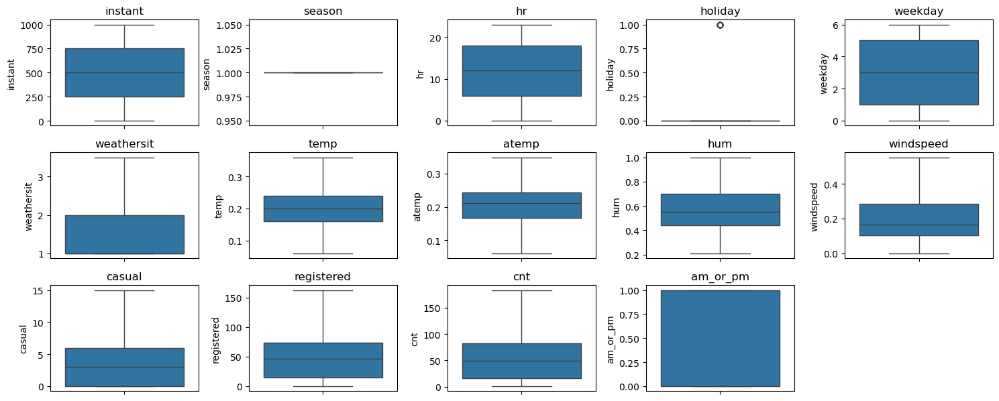

In [148]:
plt.figure(figsize=(15,10))
for i,col in enumerate(num_column,1):
    plt.subplot(5, 5, i)
    sns.boxplot(y=df[col])
    plt.title(col)
    
plt.tight_layout()
plt.show()

### Feature visualization & Insights

### BAR CHART

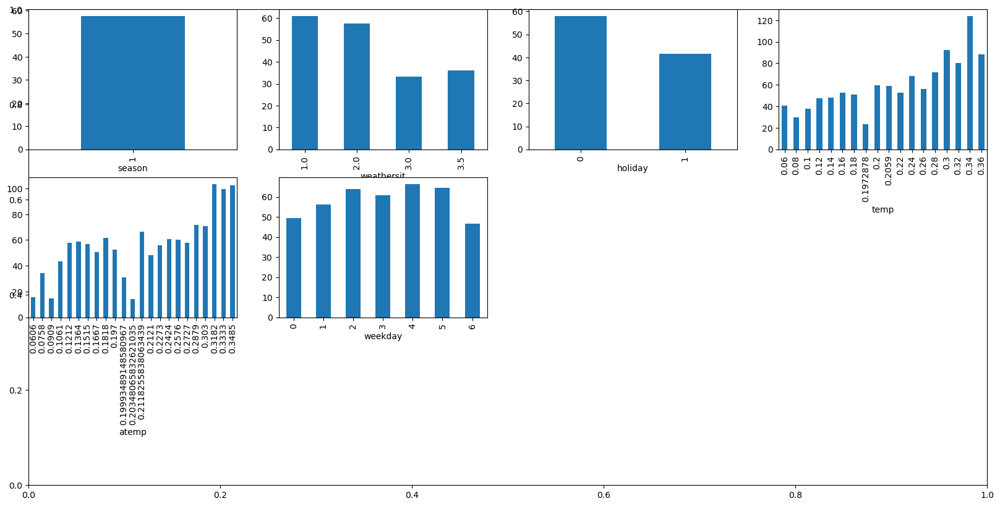

In [149]:
#Bar plot for the average count of the rentals

features = ['season', 'weathersit', 'holiday','temp','atemp', 'weekday'] 
  
plt.subplots(figsize=(20, 10)) 
for i, col in enumerate(features): 
    plt.subplot(3, 4, i + 1) 
    df.groupby(col).mean()['cnt'].plot.bar() 
plt.show()

### Distribution plot to visualize the data distribution for some columns

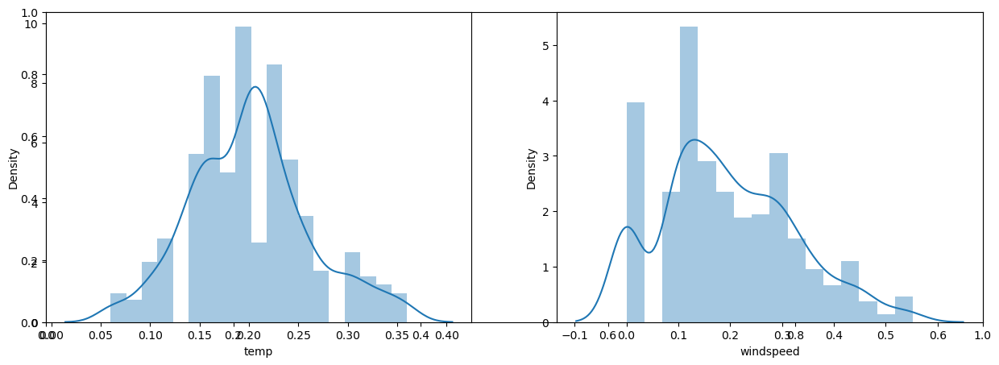

In [150]:
features = ['temp', 'windspeed'] 
  
plt.subplots(figsize=(15, 5)) 
for i, col in enumerate(features): 
  plt.subplot(1, 2, i + 1) 
  sns.distplot(df[col]) 
plt.show()

### Line Plot:
Line charts are used to represent the relation between two data X and Y on a different axis.

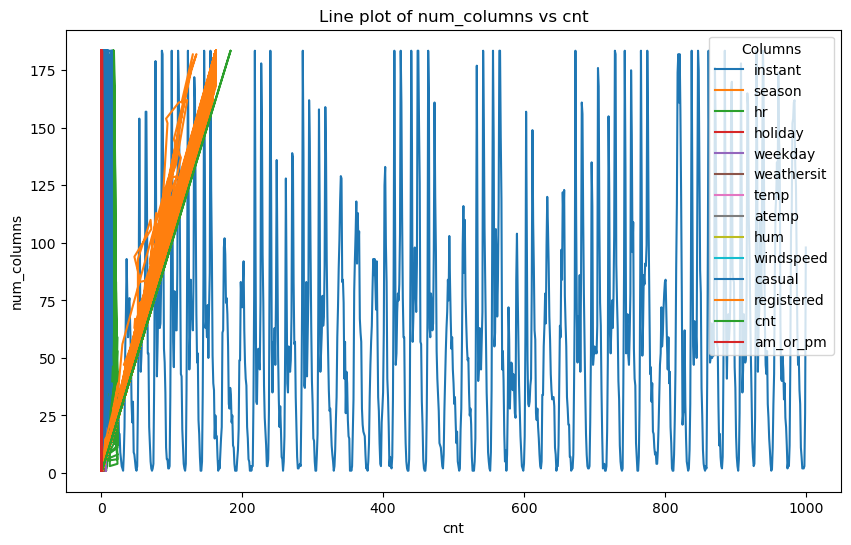

In [151]:
num_columns = df.select_dtypes(include=['float64', 'int64']).columns
x = df["cnt"]

# Create a line plot
plt.figure(figsize=(10,6))

for col in num_columns:
    plt.plot(df[col], x, label=col)

plt.xlabel('cnt')
plt.ylabel('num_columns')
plt.title('Line plot of num_columns vs cnt')
plt.legend(title='Columns')

plt.show()

### Line Plot

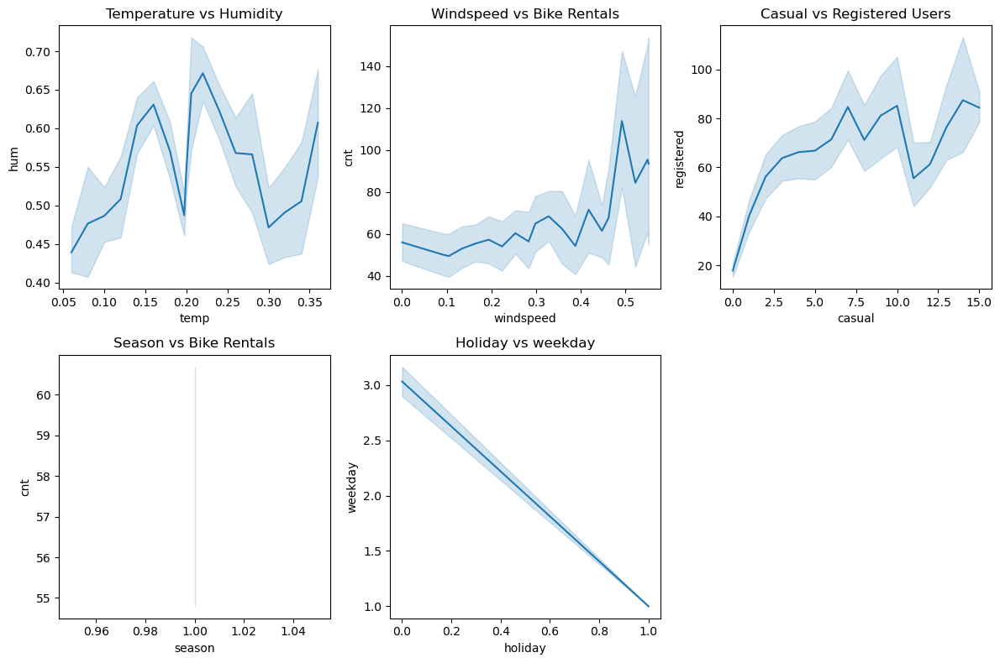

In [153]:
columns_to_plot = ['temp', 'hum', 'windspeed', 'casual', 'am_or_pm','registered', 'cnt', 'season','holiday_code','weekday']

# Creating Line plots
plt.figure(figsize=(12, 8))

# line plot: Temperature vs Humidity
plt.subplot(2, 3, 1)  # 2x3 grid, 1st subplot
sns.lineplot(x='temp', y='hum', data=df)
plt.title('Temperature vs Humidity')

# line plot: Windspeed vs Count of Bike Rentals (cnt)
plt.subplot(2, 3, 2)  # 2x3 grid, 2nd subplot
sns.lineplot(x='windspeed', y='cnt', data=df)
plt.title('Windspeed vs Bike Rentals')

# line plot: Casual users vs Registered users
plt.subplot(2, 3, 3)  # 2x3 grid, 3rd subplot
sns.lineplot(x='casual', y='registered', data=df)
plt.title('Casual vs Registered Users')

# line plot: Season vs Bike Rentals (cnt)
plt.subplot(2, 3, 4)  # 2x3 grid, 4th subplot
sns.lineplot(x='season', y='cnt', data=df)
plt.title('Season vs Bike Rentals')

# Line plot: holiday vs weekday (cnt)
plt.subplot(2, 3, 5)  # 2x3 grid, 5th subplot
sns.lineplot(x='holiday', y='weekday', data=df)
plt.title('Holiday vs weekday')
# Adjust layout and display the plots
plt.tight_layout()
plt.show()

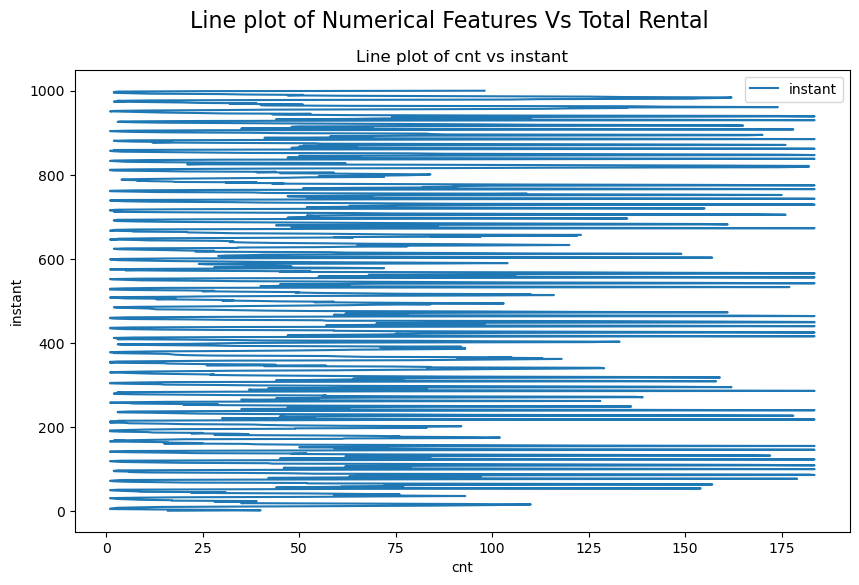

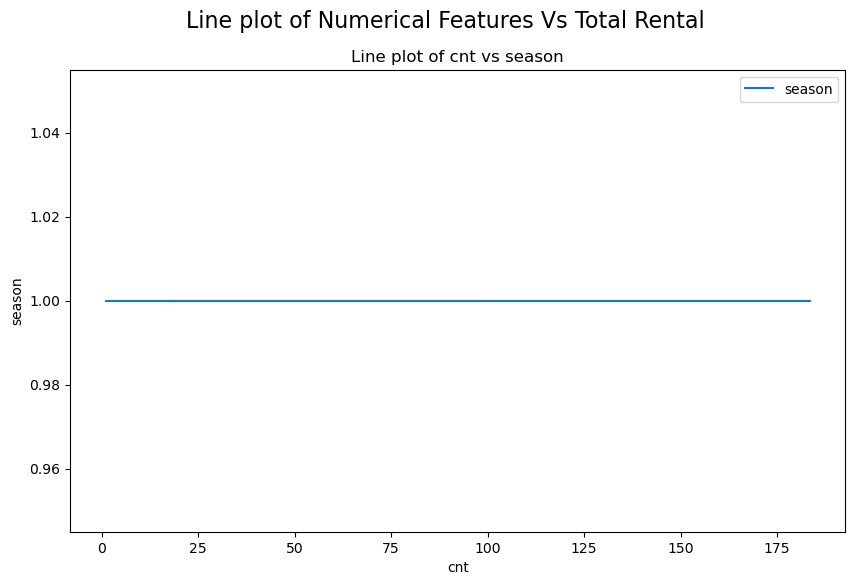

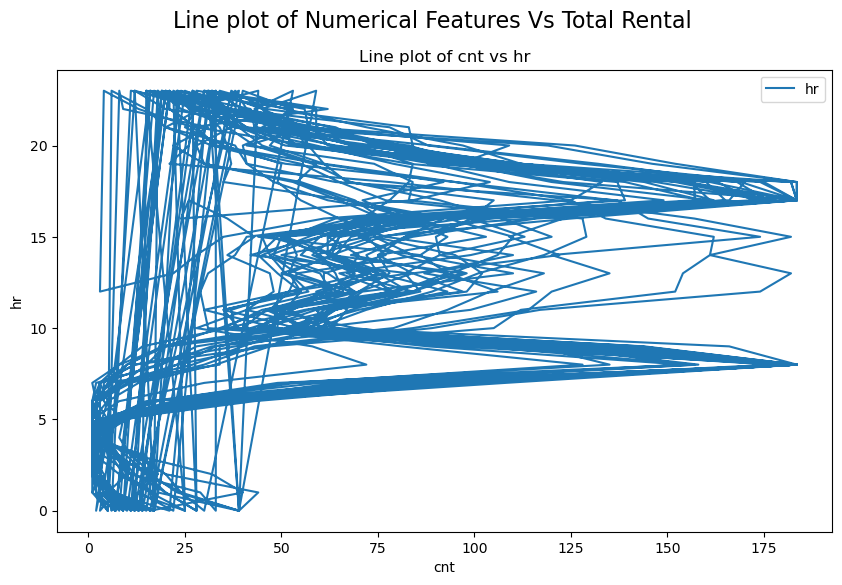

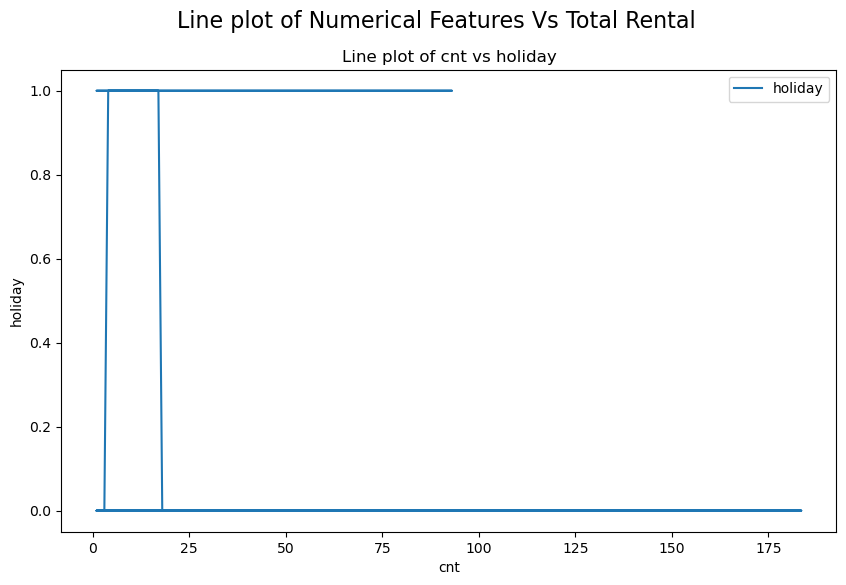

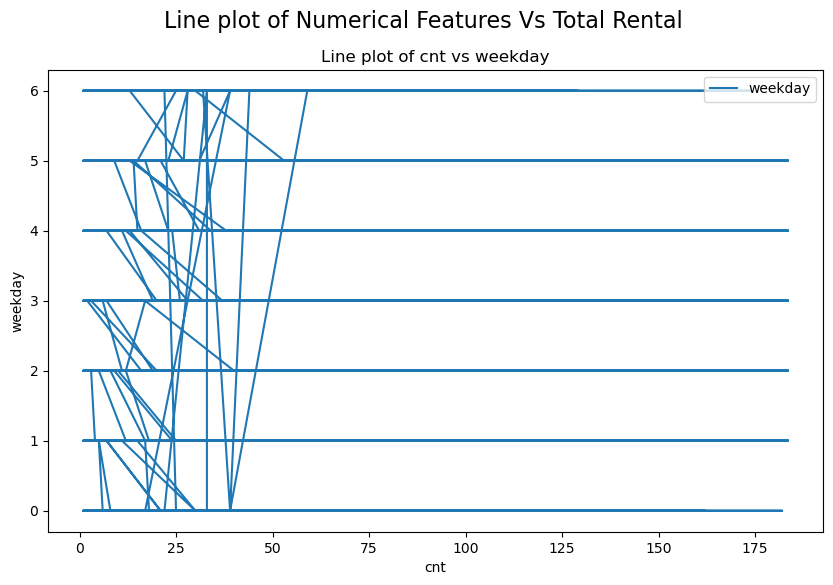

...

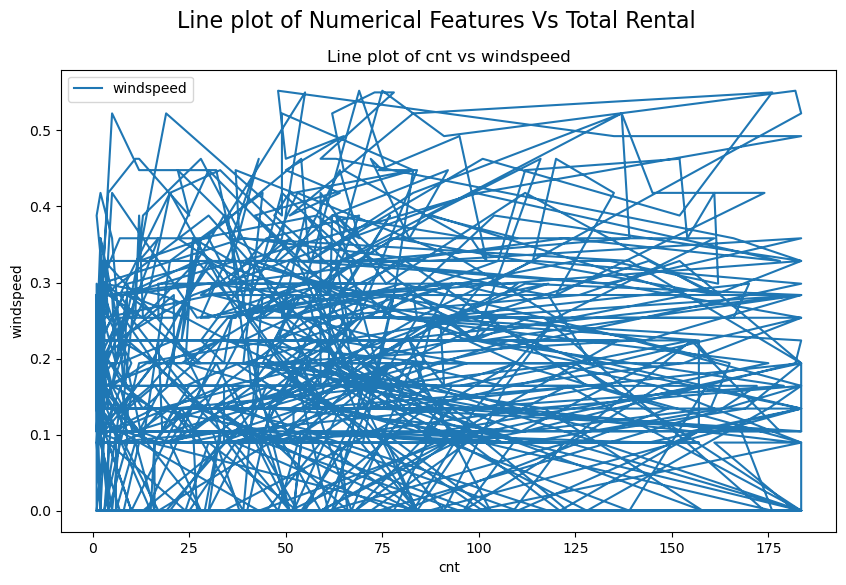

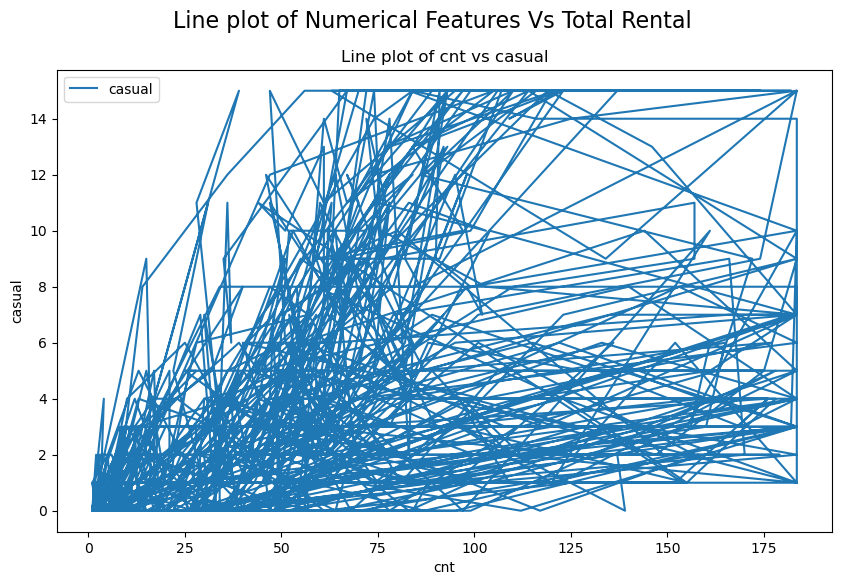

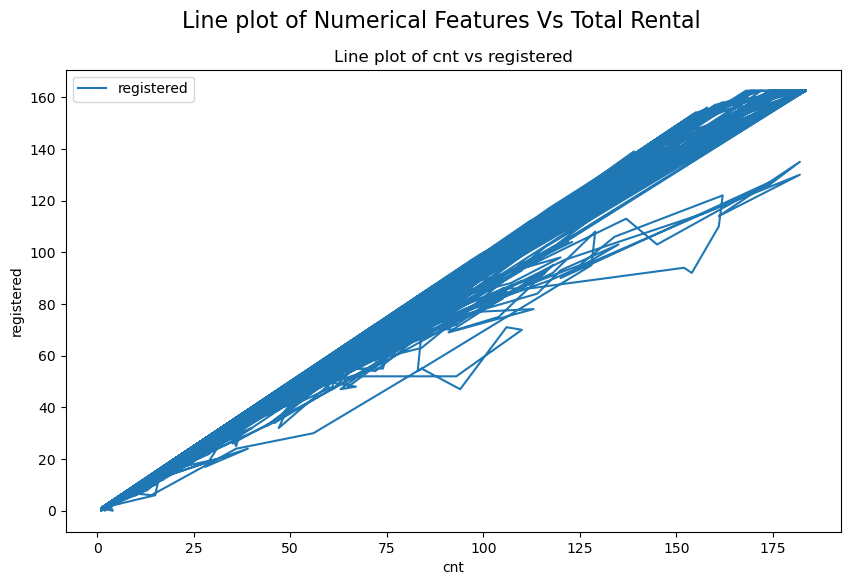

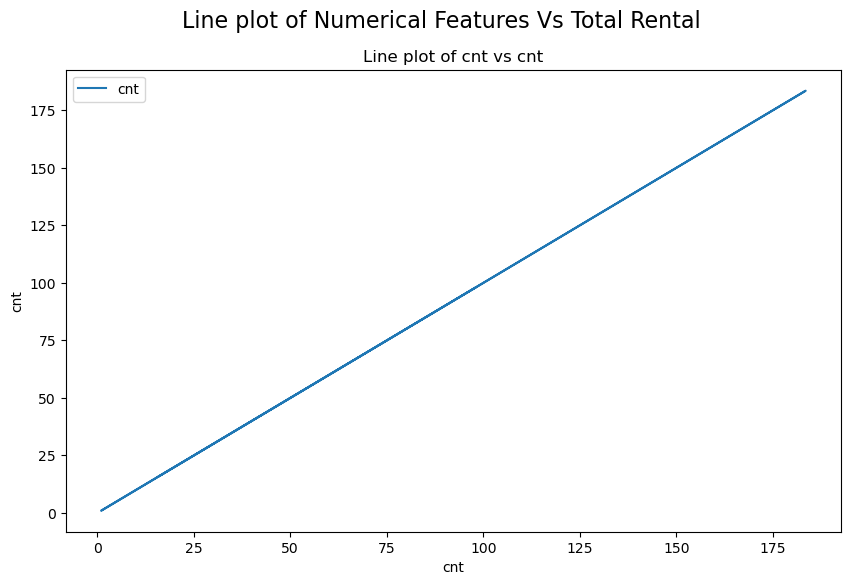

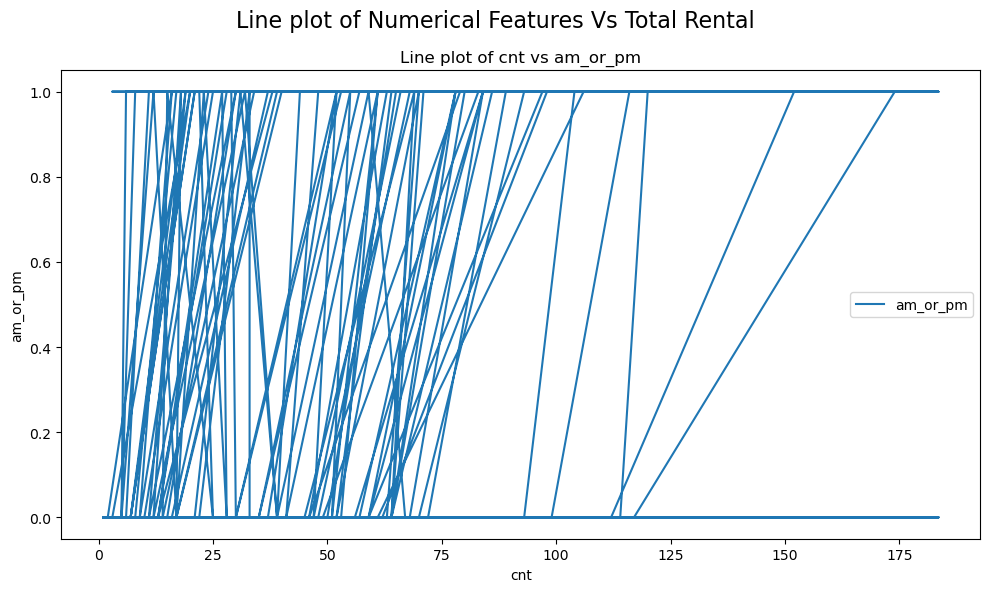

In [154]:
#Line pLot for num_columns vs cnt

for col in num_columns:
    plt.figure(figsize=(10, 6))
    plt.plot(x, df[col], label=col)
    plt.xlabel('cnt')
    plt.ylabel(col)
    plt.title(f'Line plot of cnt vs {col}')
    plt.legend()
    plt.suptitle('Line plot of Numerical Features Vs Total Rental', fontsize=16)
plt.tight_layout()
plt.show()


### Histogram

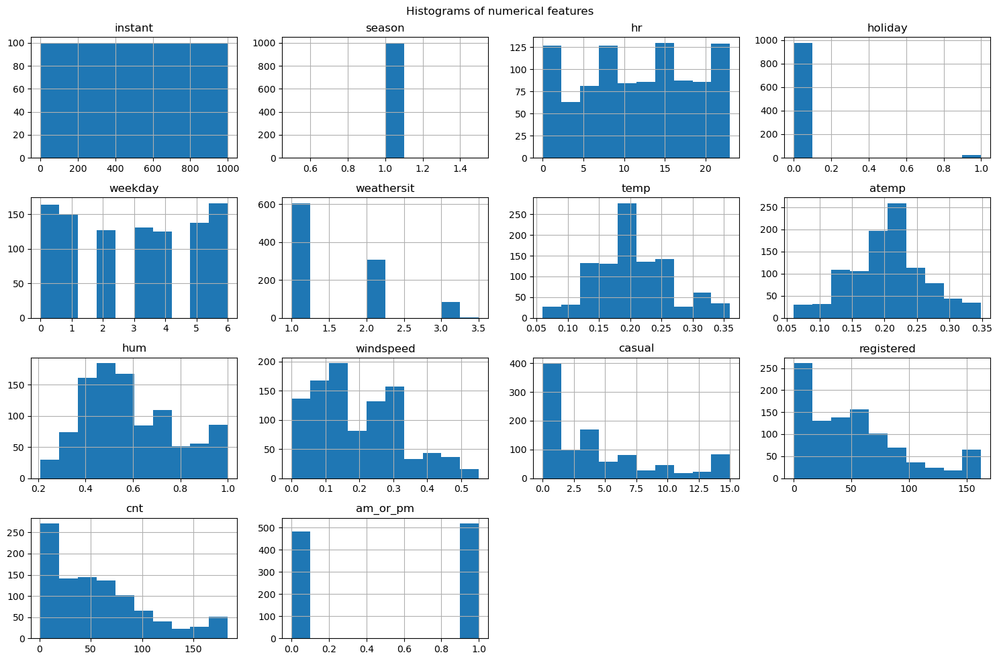

In [155]:
# Histograms
df[num_column].hist(bins=10, figsize=(15, 10))
plt.suptitle('Histograms of numerical features')
plt.tight_layout()
plt.show()

### Histogram with KDE Overlay

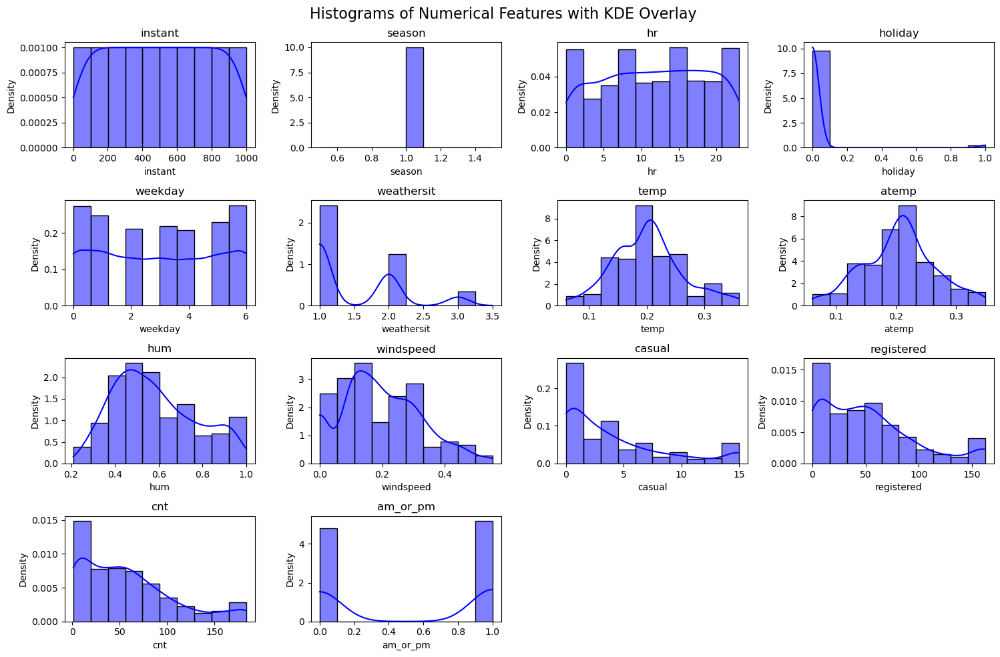

In [156]:
plt.figure(figsize=(15, 10))

for i, col in enumerate(df[num_column], 1):
    plt.subplot(4, 4, i)  # Adjust the grid size to 4 rows, 4 columns here
    sns.histplot(df[col], bins=10, kde=True, color='blue', stat='density')
    plt.title(col, fontsize=12)
    plt.xlabel(col)
    plt.ylabel('Density')
plt.suptitle('Histograms of Numerical Features with KDE Overlay', fontsize=16)
plt.tight_layout()
plt.show()

When we generate histograms of features, there are a number of common, well-understood shapes that we should look out for.

These shapes relate to well-known standard probability distributions and recognizing that the distribution of the values in the dataset for a feature closely matches one of these standard distributions can help us when building machine learning models.

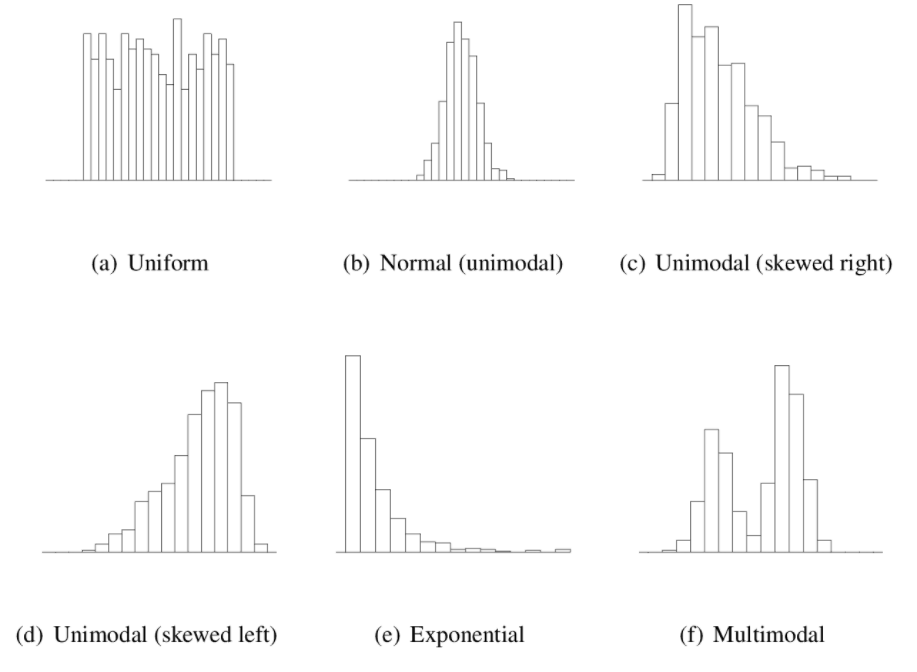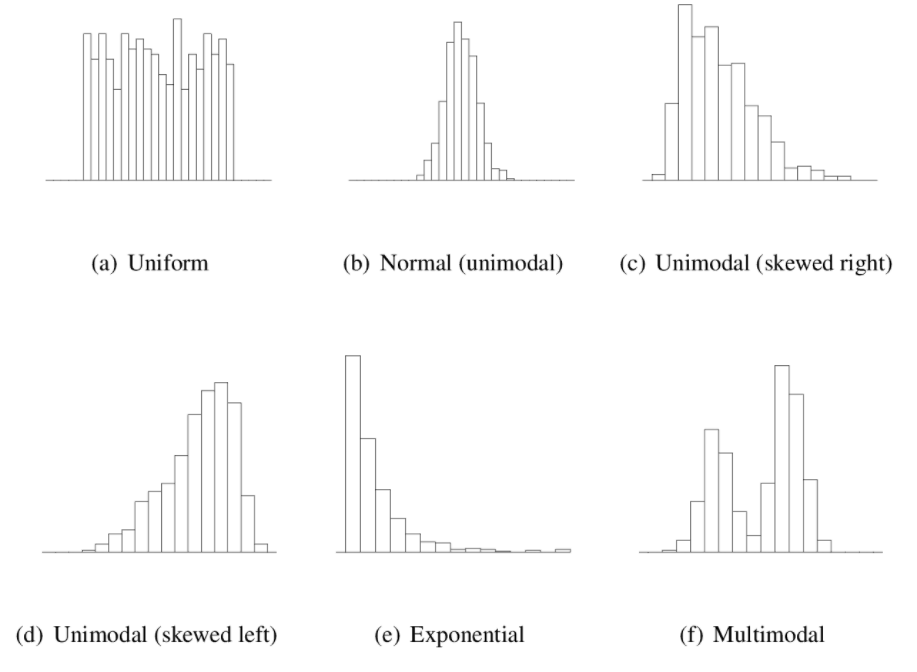

In the data sets provided mostly histogram formed are A right-skewed histogram which shows the majority of the data on the left side, with a long tail extending to the right.
Right skewness is common in many real-world datasets, such as income or house prices, where most values are clustered in a smaller range, but there are a few extreme values pulling the mean to the right.


### Violin Plot:
A Violin Plot is a combination of a box plot and a KDE (Kernel Density Estimate). It shows the distribution of the data, including its probability density, median, interquartile range, and outliers. It's especially useful for visualizing the distribution of data for categorical features or comparing distributions across categories.

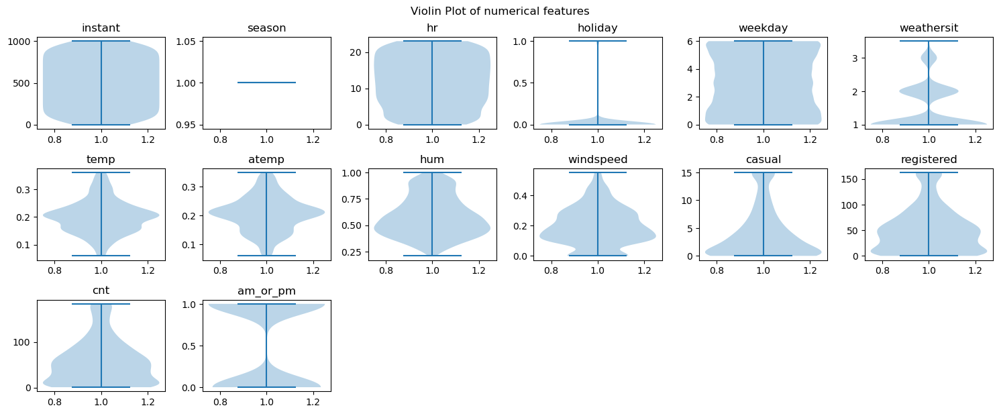

In [157]:
num_column=df.select_dtypes(include=['float64','int64']).columns

plt.figure(figsize=(15, 10))  
for i, col in enumerate(num_column, 1): 
    plt.subplot(5, 6, i)  
    plt.violinplot(df[col])  
    plt.title(col)  
    plt.suptitle('Violin Plot of numerical features')

plt.tight_layout()  
plt.show()


### Violin Plot with KDE

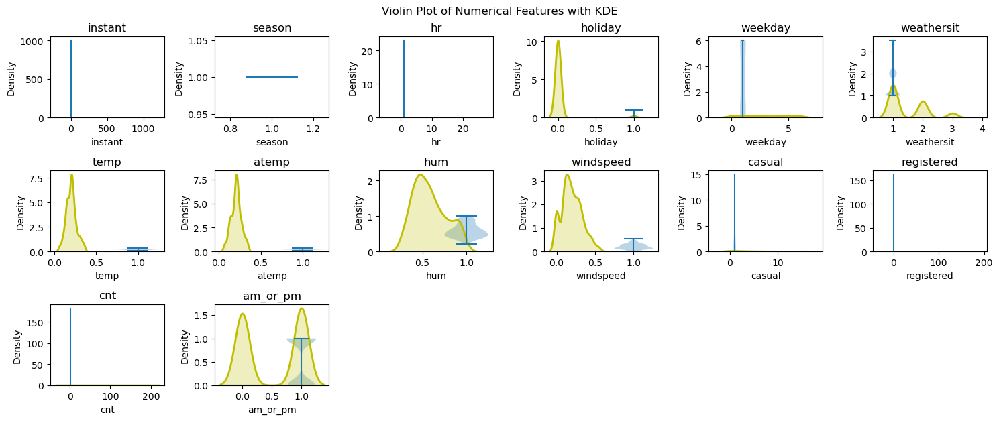

In [158]:

plt.figure(figsize=(15, 10))

# Loop through each numerical column in the DataFrame
for i, col in enumerate(num_column, 1): 
    plt.subplot(5, 6, i)
    plt.violinplot(df[col], showmeans=False) 
    sns.kdeplot(df[col], color='y', lw=2, label="KDE", fill=True)
    
    # Add title to the subplot
    plt.title(col)
    
# Add a super title for the entire figure
plt.suptitle('Violin Plot of Numerical Features with KDE')

# Adjust layout to prevent overlap
plt.tight_layout()

plt.show()

### Pair Plot:
Pair Plot gives you pairwise scatter plots to visually explore the relationships between the numerical features and cnt i.e TOTAL COUNT OF RENTALS

In [160]:
sns.pairplot(df, vars=df.columns, hue='cnt', palette="coolwarm", height=5)
plt.suptitle('Pairwise Relationships with cnt', y=1.02, fontsize=18)
plt.tight_layout()
plt.show()

### Scatter Plots:
Scatter Plots provide a direct view of how each numerical feature relates to cnt i.e TOTAL COUNT OF RENTALS

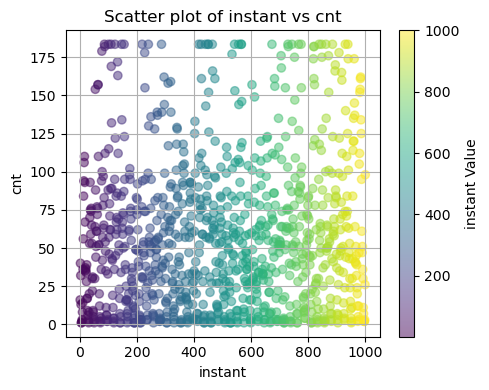

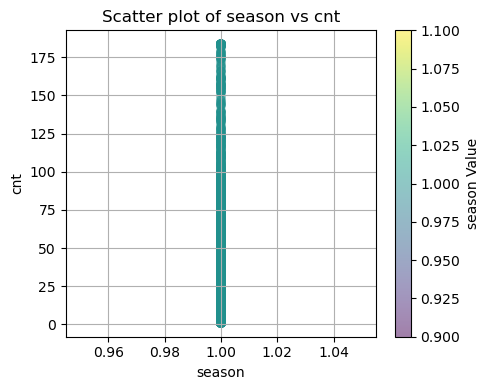

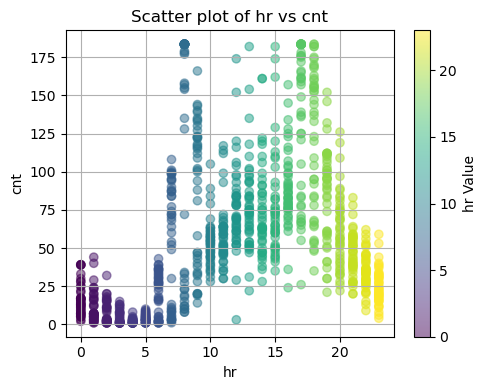

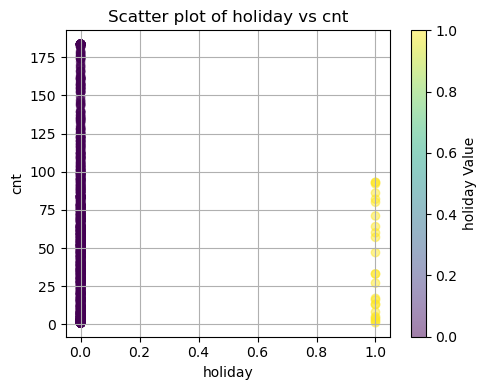

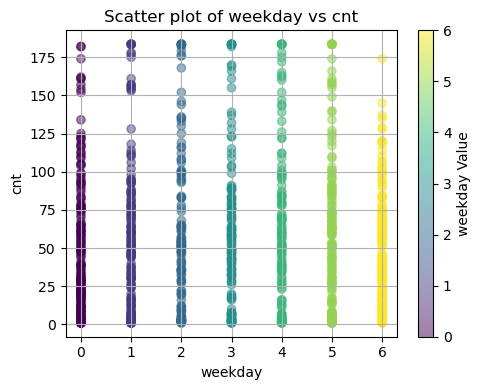

...

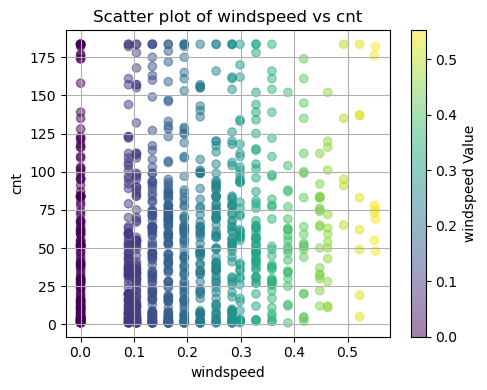

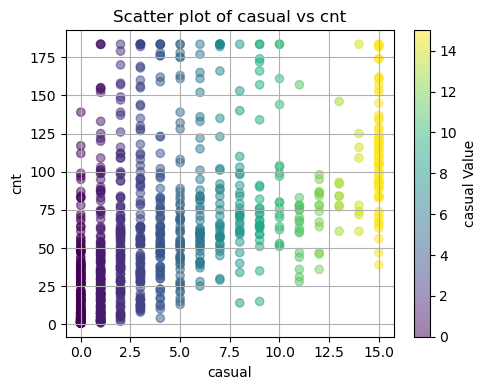

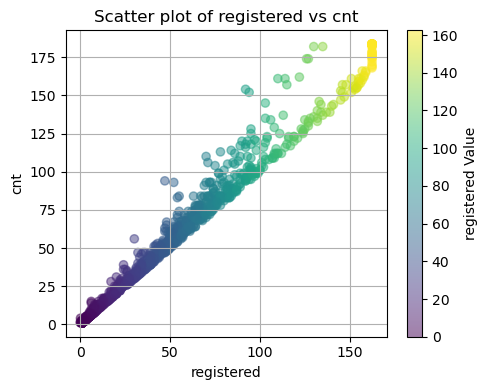

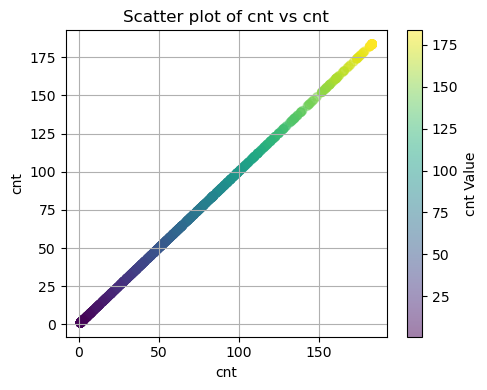

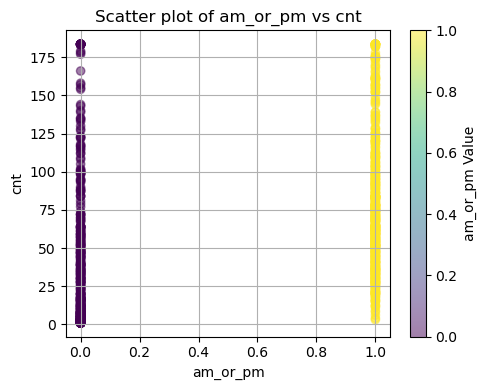

In [161]:

for feature in num_column:
     if feature!=['season','weekday','hr','mnth','temp','atemp','dteday','holiday_code']:
        plt.figure(figsize=(5, 4))
        scatter = plt.scatter(df[feature], df['cnt'], alpha=0.5, c=df[feature], cmap='viridis')  
        plt.title(f'Scatter plot of {feature} vs cnt')
        plt.xlabel(feature)
        plt.ylabel('cnt')
        plt.colorbar(scatter, label=f'{feature} Value')  
        plt.grid(True)
        plt.tight_layout()
        plt.show()

### Correlation Matrix & HeatMap:
Correlation Matrix will show the relationship between each numerical feature and cnt i.e TOTAL COUNT OF RENTALS

In [162]:
corr_matrix = df.corr()

In [163]:
 df.corr()

,instant,dteday,season,yr,mnth,hr,holiday,weekday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,am_or_pm
instant,1.00,0.17,NaN,NaN,0.80,0.00,-0.06,0.01,0.03,0.09,0.12,0.06,-0.06,0.02,0.08,0.08,0.00
dteday,0.17,1.00,NaN,NaN,-0.45,0.01,0.07,-0.04,0.03,-0.12,-0.12,-0.00,-0.05,-0.03,-0.02,-0.03,0.01
season,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
yr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mnth,0.80,-0.45,NaN,NaN,1.00,-0.03,-0.11,0.03,0.01,0.15,0.18,0.07,-0.03,0.03,0.07,0.08,-0.02
hr,0.00,0.01,NaN,NaN,-0.03,1.00,-0.01,0.01,-0.06,0.17,0.13,-0.19,0.12,0.29,0.39,0.38,0.86
holiday,-0.06,0.07,NaN,NaN,-0.11,-0.01,1.00,-0.15,0.17,-0.07,-0.08,-0.04,-0.00,0.02,-0.05,-0.05,-0.01
weekday,0.01,-0.04,NaN,NaN,0.03,0.01,-0.15,1.00,0.06,-0.07,0.03,0.06,-0.06,-0.03,0.02,0.01,0.01
weathersit,0.03,0.03,NaN,NaN,0.01,-0.06,0.17,0.06,1.00,0.07,0.13,0.54,-0.18,-0.11,-0.12,-0.13,-0.05
temp,0.09,-0.12,NaN,NaN,0.15,0.17,-0.07,-0.07,0.07,1.00,0.84,0.01,0.05,0.43,0.21,0.26,0.27


## Correlation Analysis
Analyze relationships between environmental factors and user counts.

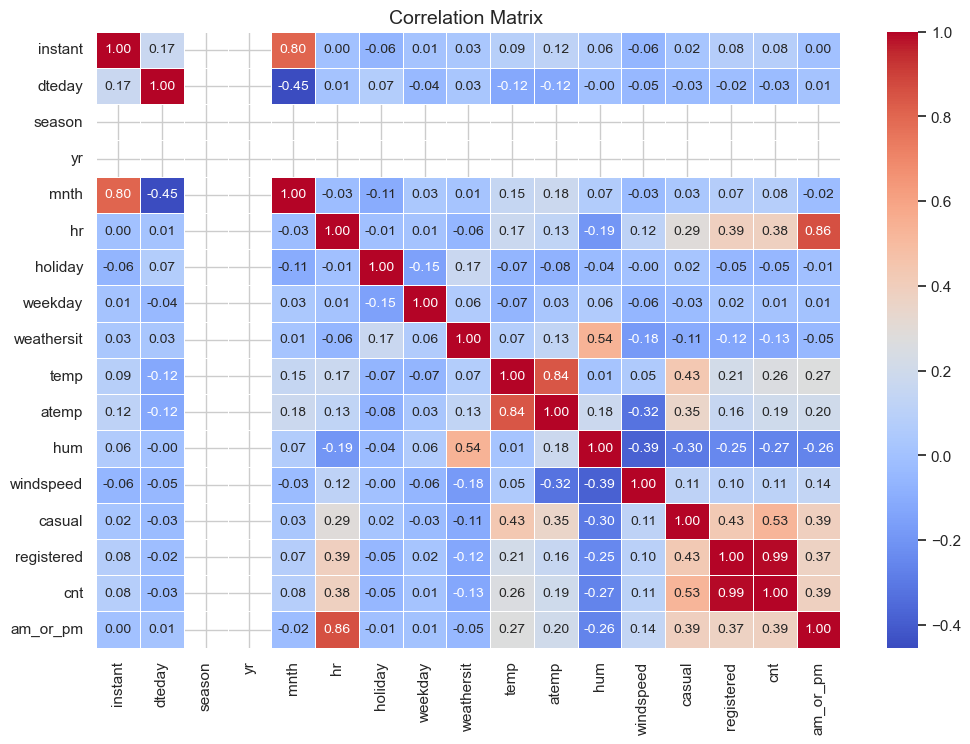

In [170]:
#HeatMap

sns.set(style="whitegrid", palette="muted")
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt='.2f', linewidths=0.5, annot_kws={'size': 10}, cbar=True)
plt.title('Correlation Matrix ', fontsize=14)
plt.show()

## Temporal Analysis
Investigate trends in user rental counts by season, hour, and holiday.

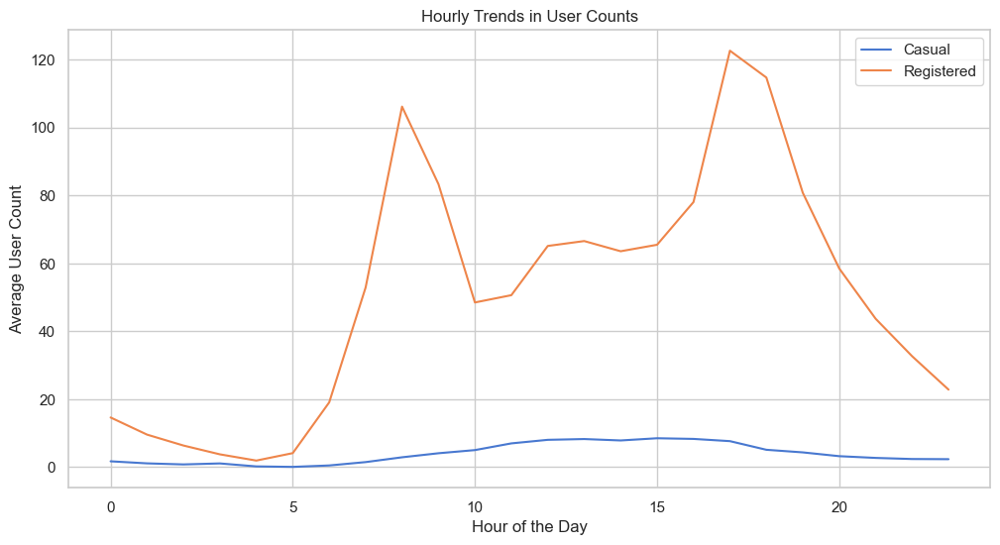

In [171]:
# Example: Average user count by hour
hourly_trends = df.groupby('hr')[['casual', 'registered']].mean()

# Plot hourly trends
hourly_trends.plot(kind='line', figsize=(12, 6))
plt.title('Hourly Trends in User Counts')
plt.xlabel('Hour of the Day')
plt.ylabel('Average User Count')
plt.legend(['Casual', 'Registered'])
plt.show()

## Feature Importance Analysis
Determine key factors influencing user behavior.

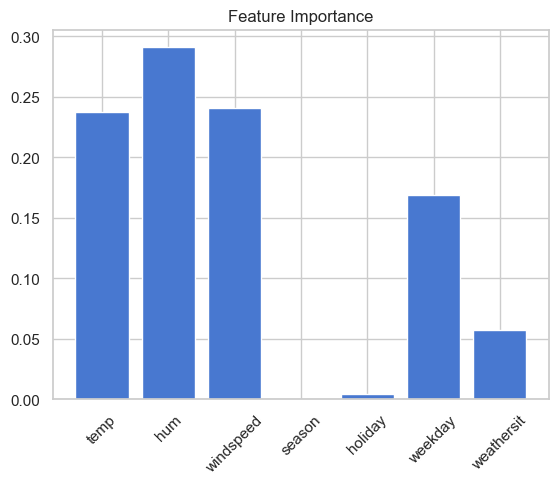

In [175]:
from sklearn.ensemble import RandomForestRegressor

# Example: Feature importance for predicting registered users
X = df[['temp', 'hum', 'windspeed', 'season', 'holiday', 'weekday', 'weathersit']]
y = df['registered']

model = RandomForestRegressor()
model.fit(X, y)

# Plot feature importance
feature_importances = model.feature_importances_
plt.bar(X.columns, feature_importances)
plt.title('Feature Importance')
plt.xticks(rotation=45)
plt.show()

### Download final data set

In [ ]:
pip install openpyxl

In [165]:
from IPython.display import FileLink
df.to_excel('final_dataset.xlsx', index=False)

# Create a downloadable link for the Excel file
FileLink(r'final_dataset.xlsx')

C:\Users\avant\Avantika Digicrome\Python basics\AI COURSE DIGICROME\Next Hikes project 2\final_dataset.xlsx

## Insights

#### 1. Correlation Analysis

Objective: Understanding relationships between environmental factors and user counts.

**Insights:**
A heatmap of correlations reveals which variables are strongly related to user counts.

**Likely findings:**

Temperature may positively correlate with user counts (more rides during warmer weather).

Humidity or windspeed might have negative correlations (less favorable conditions for outdoor activities).


#### 2. Temporal Trends

Objective: Identifying patterns in user counts across time.

**Insights:**


**Hourly Trends:**

Peaks likely occur during commuting hours (morning and evening) for registered users.

Casual users may show increased activity during weekends or leisure hours.

**Seasonal Trends:**

User counts may rise in spring/summer and dip in fall/winter.

Holidays likely show distinct patterns with more casual riders.

#### 3. Outlier Detection

**Objective:**

Identifying anomalies in user counts or environmental data.

**Insights:**

**Boxplot Analysis:**

Outliers in user counts (casual or registered) could indicate special events or data recording errors.

Extreme values in weather conditions (e.g., very high windspeed) might need separate consideration.

#### 4. Feature Importance Analysis

**Objective:**

Identifying factors most influencing user behavior.

**Insights:**

**Likely top contributors:**

Temperature: Higher temperatures often lead to increased user counts.

Season: Different seasons have distinct patterns of user activity.

Weathersit: Clear or misty weather supports more rides compared to rainy or snowy conditions.

**Lesser contributors:**

Windspeed and Humidity: These may have smaller but consistent effects on user behavior.

### Key Takeaways

**Environmental Effects** Weather conditions significantly influence ride activity, with favorable conditions (warm, clear weather) promoting more rides.

**Temporal Dynamics:** Hourly and seasonal trends provide actionable insights for optimizing resource allocation (e.g., increasing bike availability during peak hours or seasons).

**Outlier Impacts:** Special events or extreme weather conditions could skew data, and handling them separately ensures better modeling accuracy.

**Predictive Potential:** Features like temperature, season, and weather can be key predictors for forecasting user counts.
